<a href="https://colab.research.google.com/github/fzavam/IBM-final-project---FZavam/blob/master/IBM_Final_Project_Capstone.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

## 1. Install and import necessary libraries

In [0]:
# install wget:

!pip install wget

  Created wheel for wget: filename=wget-3.2-cp36-none-any.whl size=9682 sha256=ec77a6c833aceb4220a6700a5d466574df6ddc41f1f5ef7a404970a59bbd8171
  Stored in directory: /root/.cache/pip/wheels/40/15/30/7d8f7cea2902b4db79e3fea550d7d7b85ecb27ef992b618f3f
Successfully built wget


In [0]:
# import library:

import requests
import json # library to handle JSON files
import pandas as pd
import numpy as np
import seaborn as sns
import folium
%matplotlib inline 
import matplotlib as mpl
import matplotlib.pyplot as plt
import matplotlib.dates as mdates
from datetime import datetime, timedelta
from datetime import date
from pandas.io.json import json_normalize
from geopy.geocoders import Nominatim 
from folium import plugins
from folium.plugins import FastMarkerCluster
import wget

/usr/local/lib/python3.6/dist-packages/statsmodels/tools/_testing.py:19: FutureWarning: pandas.util.testing is deprecated. Use the functions in the public API at pandas.testing instead.
  import pandas.util.testing as tm


## 2. Downloading and opening the dataframe

 #### Data set 1 - Covid cases in the USA 
States Current Values of infecteds is obtained from COVID-19 Tracking project. The COVID Tracking Project collects information from 50 US states, the District of Columbia, and 5 other US territories to provide the most comprehensive testing data we can collect for the novel coronavirus, SARS-CoV-2. We attempt to report positive and negative results, pending tests, and total people tested for each state or district currently reporting that data. Initial basic API & CSV  is available in the url: https://covidtracking.com/api/
 
This data was divided into two types, one that has the timeline of contamination, death and number of people hospitalized by State; and another one that is the last update of this data, that is, the current picture.

In [0]:
# load the GET request for the COVID-19 Tracking (Dataset 1):

states_url = "https://covidtracking.com/api/states/daily"
r = requests.get(states_url)
states_df = pd.DataFrame(r.json())

In [0]:
# transform in dataframe:

states_df['date'] = pd.to_datetime(states_df.date, format="%Y%m%d")
states_df = states_df[['date', 'state', 'positive', 'negative','hospitalized','death','total','hospitalizedIncrease','positiveIncrease']].sort_values('date')
cols = {}

states_df.tail()

,date,state,positive,negative,hospitalized,death,total,hospitalizedIncrease,positiveIncrease
32,2020-04-13,NE,814.0,10158.0,NaN,17.0,10972.0,0.0,23.0
31,2020-04-13,ND,331.0,10450.0,40.0,8.0,10781.0,1.0,23.0
30,2020-04-13,NC,4816.0,58572.0,NaN,86.0,63388.0,0.0,296.0
28,2020-04-13,MS,2942.0,28042.0,549.0,98.0,30984.0,1.0,161.0
0,2020-04-13,AK,277.0,7553.0,32.0,8.0,7830.0,1.0,5.0


In [0]:
# the lastest update day:

yesterday = datetime.strftime(datetime.now() - timedelta(1), '%Y-%m-%d')
print('Yesterday was', yesterday)

Yesterday was 2020-04-13


In [0]:
# dataframe daily updated (last day):

df_upd_states = states_df.loc[states_df['date'] == yesterday]
df_upd_states.head()

,date,state,positive,negative,hospitalized,death,total,hospitalizedIncrease,positiveIncrease
18,2020-04-13,KS,1376.0,12488.0,309.0,62.0,13864.0,11.0,39.0
15,2020-04-13,ID,1426.0,13455.0,132.0,27.0,14881.0,1.0,19.0
16,2020-04-13,IL,22025.0,83743.0,NaN,794.0,105768.0,0.0,1173.0
17,2020-04-13,IN,8236.0,36303.0,NaN,350.0,44539.0,0.0,308.0
19,2020-04-13,KY,1963.0,23903.0,667.0,97.0,25866.0,208.0,123.0


In [0]:
df_upd_top = df_upd_states[['state','positive','death']].sort_values('positive', ascending=False)
df_upd_top.head()

,state,positive,death
37,NY,195031.0,10056.0
34,NJ,64584.0,2443.0
21,MA,26867.0,844.0
24,MI,25635.0,1602.0
41,PA,24199.0,524.0


#### Data set 2 - ICU beds in United States

Kaiser Health News evaluated the capacity of intensive care unit (ICU) beds around the nation by first identifying the number of ICU beds each hospital reported in its most recent financial cost report, filed annually to the Centers for Medicare & Medicaid Services. KHN included beds reported in the categories of intensive care unit, surgical intensive care unit, coronary care unit and burn intensive care unit. KHN’s ICU bed tally does not include Veterans Affairs hospitals, which are sure to play a role in treating coronavirus victims, because VA hospitals do not file cost reports. The total number of the nation’s ICU beds in the cost reports is less than the number identified by the American Hospital Association’s annual survey of hospital beds, which is the other authoritative resource on hospital characteristics. Experts attributed the discrepancies to different definitions of what qualifies as an ICU bed and other factors, and told KHN both sources were equally credible. 
https://khn.org/news/as-coronavirus-spreads-widely-millions-of-older-americans-live-in-counties-with-no-icu-beds/ 


In [0]:
# read data about ICU beds in US:

df_icu_county = pd.read_csv('data-FPBfZ.csv')
df_icu_county.head()

,State,County,ICU Beds,Total Population,Population Aged 60+,Percent of Population Aged 60+,Residents Aged 60+ Per Each ICU Bed
0,Alabama,Autauga,6,55036,10523,19.1,1754.0
1,Alabama,Baldwin,51,203360,53519,26.3,1049.0
2,Alabama,Barbour,5,26201,6150,23.5,1230.0
3,Alabama,Bibb,0,22580,4773,21.1,NaN
4,Alabama,Blount,6,57667,13600,23.6,2267.0


In [0]:
# columns of the dataframe
np.unique(df_icu_county.columns)

array(['County', 'ICU Beds', 'Percent of Population Aged 60+',
       'Population Aged 60+', 'Residents Aged 60+ Per Each ICU Bed',
       'State', 'Total Population'], dtype=object)

In [0]:
# create a dataframe with the states grouped and select columns sum:

df_icu_states = df_icu_county.groupby('State')[['ICU Beds',
                                                'Population Aged 60+', 
                                                'Residents Aged 60+ Per Each ICU Bed', 
                                                'Total Population']].sum()
df_icu_states.reset_index(inplace=True)
df_icu_states.head()

,State,ICU Beds,Population Aged 60+,Residents Aged 60+ Per Each ICU Bed,Total Population
0,Alabama,1533,1065625,53854.0,4850771
1,Alaska,119,117047,6424.0,738565
2,Arizona,1559,1502688,21304.0,6809946
3,Arkansas,732,655552,27536.0,2977944
4,California,7338,7292299,68758.0,38982847


In [0]:
df_ICU_top = df_icu_states[['State','ICU Beds','Residents Aged 60+ Per Each ICU Bed']].sort_values('ICU Beds', ascending=False)
df_ICU_top.head()

,State,ICU Beds,Residents Aged 60+ Per Each ICU Bed
4,California,7338,68758.0
43,Texas,6199,99694.0
9,Florida,5604,52222.0
32,New York,3952,72521.0
35,Ohio,3314,97902.0


#### Data set 3 - United States hospitals

This database contains locations of Hospitals for 50 states and Washington D.C. , Puerto Rico and US territories. The dataset only includes hospital facilities and does not include nursing homes. Data for all the states was acquired from respective states departments or their open source websites and then geocoded and converted into a spatial database. Not Available denotes information that was either missing in the source data or data that has not been populated current version.Updated: December 2, 2019. https://catalog.data.gov/dataset/hospitals-dcdfc


In [0]:
# read json file with hospitals data

with open('Hospitals.geojson', encoding='utf-8') as f:
    data = json.load(f)

In [0]:
# transform in a dataframe

hospitals_data = data['features']
hospitals_df = pd.json_normalize(hospitals_data)
hospitals_df.head(5)

,type,properties.OBJECTID,properties.ID,properties.NAME,properties.ADDRESS,properties.CITY,properties.STATE,properties.ZIP,properties.ZIP4,properties.TELEPHONE,properties.TYPE,properties.STATUS,properties.POPULATION,properties.COUNTY,properties.COUNTYFIPS,properties.COUNTRY,properties.LATITUDE,properties.LONGITUDE,properties.NAICS_CODE,properties.NAICS_DESC,properties.SOURCE,properties.SOURCEDATE,properties.VAL_METHOD,properties.VAL_DATE,properties.WEBSITE,properties.STATE_ID,properties.ALT_NAME,properties.ST_FIPS,properties.OWNER,properties.TTL_STAFF,properties.BEDS,properties.TRAUMA,properties.HELIPAD,geometry.type,geometry.coordinates
0,Feature,2001,0072091763,MONTCLAIR HOSPITAL MEDICAL CENTER,5000 SAN BERNARDINO STREET,MONTCLAIR,CA,91763,NOT AVAILABLE,NOT AVAILABLE,GENERAL ACUTE CARE,OPEN,102,SAN BERNARDINO,06071,USA,34.078758,-117.695977,622110,GENERAL MEDICAL AND SURGICAL HOSPITALS,http://www.oshpd.ca.gov/HID/Facility-Listing.html,2018-08-08T00:00:00.000Z,IMAGERY/OTHER,2015-01-14T00:00:00.000Z,http://www.montclair-hospital.org/,NOT AVAILABLE,NOT AVAILABLE,06,NON-PROFIT,-999,102,NOT AVAILABLE,N,Point,"[-117.69597657299995, 34.07875776600002]"
1,Feature,2002,0073491208,USC VERDUGO HILLS HOSPITAL,1812 VERDUGO BOULEVARD,GLENDALE,CA,91208,NOT AVAILABLE,(818) 790-7100,GENERAL ACUTE CARE,OPEN,158,LOS ANGELES,06037,USA,34.204889,-118.215980,622110,GENERAL MEDICAL AND SURGICAL HOSPITALS,http://www.oshpd.ca.gov/HID/Facility-Listing.html,2018-08-08T00:00:00.000Z,IMAGERY/OTHER,2015-01-14T00:00:00.000Z,http://uscvhh.org/,NOT AVAILABLE,NOT AVAILABLE,06,NON-PROFIT,-999,158,NOT AVAILABLE,Y,Point,"[-118.21598001199999, 34.20488885700007]"
2,Feature,2003,0082830342,CHILDRENS HEALTHCARE OF ATLANTA AT SCOTTISH RITE,1001 JOHNSON FERRY RD,ATLANTA,GA,30342,NOT AVAILABLE,(404) 785-5437,CHILDREN,OPEN,250,FULTON,13121,USA,33.906082,-84.353952,622110,"CHILDREN'S HOSPITALS, GENERAL",http://www.gamap2care.info/,2018-08-09T00:00:00.000Z,IMAGERY/OTHER,2015-03-02T00:00:00.000Z,http://www.choa.org/,113,NOT AVAILABLE,13,NON-PROFIT,-999,250,LEVEL II PEDIATRIC,Y,Point,"[-84.35395183699995, 33.90608164100007]"
3,Feature,2004,0083030033,DEKALB MEDICAL CENTER AT NORTH DECATUR,2701 N DECATUR ROAD,DECATUR,GA,30033,NOT AVAILABLE,(404) 501-1000,GENERAL ACUTE CARE,OPEN,451,DEKALB,13089,USA,33.791089,-84.282910,622110,GENERAL MEDICAL AND SURGICAL HOSPITALS,http://www.gamap2care.info/,2018-08-09T00:00:00.000Z,IMAGERY/OTHER,2015-03-02T00:00:00.000Z,http://www.dekalbmedical.org/,NOT AVAILABLE,NOT AVAILABLE,13,NON-PROFIT,-999,451,NOT AVAILABLE,N,Point,"[-84.28291009899993, 33.79108913500006]"
4,Feature,2005,0165270815,WOMAN'S HOSPITAL,100 WOMAN'S WAY,BATON ROUGE,LA,70815,NOT AVAILABLE,(225) 927-1300,WOMEN,OPEN,-999,EAST BATON ROUGE,22033,USA,30.385655,-91.038050,622110,GENERAL MEDICAL AND SURGICAL HOSPITALS,http://new.dhh.louisiana.gov/index.cfm/directo...,2018-08-16T00:00:00.000Z,IMAGERY/OTHER,2015-06-01T00:00:00.000Z,http://www.womans.org,NOT AVAILABLE,NOT AVAILABLE,22,NON-PROFIT,-999,-999,NOT AVAILABLE,Y,Point,"[-91.03805021099998, 30.385655327000052]"


In [0]:
hospitals_df.columns

Index(['type', 'properties.OBJECTID', 'properties.ID', 'properties.NAME',
       'properties.ADDRESS', 'properties.CITY', 'properties.STATE',
       'properties.ZIP', 'properties.ZIP4', 'properties.TELEPHONE',
       'properties.TYPE', 'properties.STATUS', 'properties.POPULATION',
       'properties.COUNTY', 'properties.COUNTYFIPS', 'properties.COUNTRY',
       'properties.LATITUDE', 'properties.LONGITUDE', 'properties.NAICS_CODE',
       'properties.NAICS_DESC', 'properties.SOURCE', 'properties.SOURCEDATE',
       'properties.VAL_METHOD', 'properties.VAL_DATE', 'properties.WEBSITE',
       'properties.STATE_ID', 'properties.ALT_NAME', 'properties.ST_FIPS',
       'properties.OWNER', 'properties.TTL_STAFF', 'properties.BEDS',
       'properties.TRAUMA', 'properties.HELIPAD', 'geometry.type',
       'geometry.coordinates'],
      dtype='object')

In [0]:
# select and rename the columns of dataframe:

hosp_df = hospitals_df[['properties.ADDRESS',
                        'properties.BEDS',
                        'properties.CITY',
                        'properties.COUNTRY', 
                        'properties.COUNTY',       
                        'properties.HELIPAD',  
                        'properties.LATITUDE',
                        'properties.LONGITUDE',
                        'properties.ZIP',
                        'properties.NAME',
                        'properties.STATE',
                        'properties.TYPE']]

hosp_df.columns = ['ADDRESS', 'BEDS', 'CITY','COUNTRY', 
                        'COUNTY','HELIPAD', 'LATITUDE',
                        'LONGITUDE', 'ZIP','NAME', 'STATE', 'TYPE']

In [0]:
# take a orveview in the dataframe

hosp_df.describe(include=['object'])

,ADDRESS,CITY,COUNTRY,COUNTY,HELIPAD,ZIP,NAME,STATE,TYPE
count,7581,7581,7581,7581,7581,7581,7581,7581,7581
unique,7446,3377,7,1604,2,5624,7306,57,10
top,100 HOSPITAL DRIVE,HOUSTON,USA,LOS ANGELES,Y,77030,MEMORIAL HOSPITAL,TX,GENERAL ACUTE CARE
freq,8,70,7498,131,4201,11,12,798,4524


In [0]:
np.unique(hosp_df['COUNTRY'])

array(['ASM', 'GUM', 'MNP', 'PLW', 'PRI', 'USA', 'VIR'], dtype=object)

In [0]:
# selecting only USA data:

hosp_df = hosp_df[hosp_df['COUNTRY'].str.contains("USA")]
hosp_df.describe(include=['object'])

,ADDRESS,CITY,COUNTRY,COUNTY,HELIPAD,ZIP,NAME,STATE,TYPE
count,7498,7498,7498,7498,7498,7498,7498,7498,7498
unique,7370,3333,1,1576,2,5572,7223,51,10
top,100 HOSPITAL DRIVE,HOUSTON,USA,LOS ANGELES,Y,77030,MEMORIAL HOSPITAL,TX,GENERAL ACUTE CARE
freq,8,70,7498,131,4176,11,12,798,4451


In [0]:
# take out wrong value of beds:

np.unique(hosp_df['BEDS'])

hosp_df['BEDS'] = hosp_df['BEDS'].drop(hosp_df[hosp_df['BEDS'] == -999].index)

In [0]:
np.unique(hosp_df['STATE'])

array(['AK', 'AL', 'AR', 'AZ', 'CA', 'CO', 'CT', 'DC', 'DE', 'FL', 'GA',
       'HI', 'IA', 'ID', 'IL', 'IN', 'KS', 'KY', 'LA', 'MA', 'MD', 'ME',
       'MI', 'MN', 'MO', 'MS', 'MT', 'NC', 'ND', 'NE', 'NH', 'NJ', 'NM',
       'NV', 'NY', 'OH', 'OK', 'OR', 'PA', 'RI', 'SC', 'SD', 'TN', 'TX',
       'UT', 'VA', 'VT', 'WA', 'WI', 'WV', 'WY'], dtype=object)

In [0]:
# drop Alaska (AK) and Hawaii (HI):

# !!! NÃO TÁ CERTO

hosp_df[~hosp_df.STATE.str.contains('HI')]
print(hosp_df.shape)

(7498, 12)


#### Data set 4 - New York COVID-19 

For the neighborhood in New York City was used the dataframe by New York City Department of Health and Mental Hygiene. In https://www.nytimes.com/interactive/2020/04/01/nyregion/nyc-coronavirus-cases-map.html
Update : April, 1, 2020.

The cities data for NY is from Note: https://www.nytimes.com/interactive/2020/us/new-york-coronavirus-cases.html
Data are based on reports by states and counties at the time of publication. Local governments may revise reported numbers as they get new information. Some deaths may be reported by officials in two different jurisdictions. When possible, deaths have been reported here in the jurisdiction where the death occurred. Read more about this data here. While the first known case in the United States was announced on Jan. 21, charts show cases since Feb. 26, when American public health officials first identified community transmission of the virus. *Cases in New York City and Kansas City, Mo., both of which span several counties, are grouped together. Cases in a state that have been reported without a specific county are listed as county “unknown.” Population data from Census Bureau.

In [0]:
# numbers of infected each county:

df_NY_county = pd.read_excel('10_04_ny_cases.xlsx')
df_NY_county

,Unnamed: 0,CASES,DEATHS
0,New York City,92.384,5.663
1,Nassau,21.512,890.000
2,Suffolk,18.692,425.000
3,Westchester,18.077,428.000
4,Rockland,7.122,135.000
5,Orange,4.532,91.000
6,Dutchess,1.598,25.000
7,Erie,1.409,58.000
8,Monroe,742.000,35.000
9,Ulster,530.000,2.000


In [0]:
# rename the columns
df_NY_county.rename(columns={'Unnamed: 0': 'COUNTY'}).head()

,COUNTY,CASES,DEATHS
0,New York City,92.384,5.663
1,Nassau,21.512,890.000
2,Suffolk,18.692,425.000
3,Westchester,18.077,428.000
4,Rockland,7.122,135.000


In [0]:
# read the data with the cases in NYC each borough and zipcode:
df_NYC_borough = pd.read_excel('NYC_borough.xlsx')
df_NYC_borough.head()

,ZIP code,Borough,Total cases,"Cases per 1,000 people"
0,11368,Queens,947,9
1,11373,Queens,831,9
2,11219,Brooklyn,771,9
3,10467,Bronx,638,7
4,11230,Brooklyn,631,8


In [0]:
# read data with latitude and longitude dataframof each zipcode:
  zip_latlng = pd.read_csv('US Zip Codes from 2013.csv')
  zip_latlng.head()

,ZIP,LAT,LNG
0,601,18.180555,-66.749961
1,602,18.361945,-67.175597
2,603,18.455183,-67.119887
3,606,18.158345,-66.932911
4,610,18.295366,-67.125135


In [0]:
#merge the latitude and longitude df with the the cases in NYC:

df_NYC_borough['LAT'] = df_NYC_borough['ZIP code'].map(zip_latlng.set_index('ZIP')['LAT'])
df_NYC_borough['LNG'] = df_NYC_borough['ZIP code'].map(zip_latlng.set_index('ZIP')['LNG'])
df_NYC_borough.head()

,ZIP code,Borough,Total cases,"Cases per 1,000 people",LAT,LNG
0,11368,Queens,947,9,40.751718,-73.851822
1,11373,Queens,831,9,40.738837,-73.878535
2,11219,Brooklyn,771,9,40.632667,-73.996669
3,10467,Bronx,638,7,40.869953,-73.865746
4,11230,Brooklyn,631,8,40.622164,-73.965105


In [0]:
# create a dataframe with the borough grouped and select columns sum:

df_nyc_bor_sum = df_NYC_borough.groupby('Borough')[['Total cases','Cases per 1,000 people']].sum()
df_nyc_bor_sum.reset_index(inplace=True)
df_nyc_bor_sum.head()

,Borough,Total cases,"Cases per 1,000 people"
0,Bronx,7183,139
1,Brooklyn,10735,167
2,Manhattan,6106,183
3,Queens,12467,341
4,Staten Island,2355,65


#### Geospatial data 1 - US States geometry

In order to create a Choropleth map to analyzes the spacial distribution of the data, is necessary a GeoJSON file that defines the areas/boundaries of the state, county of interested. In my case, since I'm endeavoring to create a US map, I want a GeoJSON that defines the boundaries of all US state and county.

In [0]:
# download countries geojson file

file_url = 'https://raw.githubusercontent.com/python-visualization/folium/master/examples/data/us-states.json'
file_name = wget.download(file_url)

In [0]:
# open like json data

with open(file_name) as json_data:
    US_states = json.load(json_data)

In [0]:
US_states_data = US_states['features']
US_states_data[0]

{'geometry': {'coordinates': [[[-87.359296, 35.00118],
    [-85.606675, 34.984749],
    [-85.431413, 34.124869],
    [-85.184951, 32.859696],
    [-85.069935, 32.580372],
    [-84.960397, 32.421541],
    [-85.004212, 32.322956],
    [-84.889196, 32.262709],
    [-85.058981, 32.13674],
    [-85.053504, 32.01077],
    [-85.141136, 31.840985],
    [-85.042551, 31.539753],
    [-85.113751, 31.27686],
    [-85.004212, 31.003013],
    [-85.497137, 30.997536],
    [-87.600282, 30.997536],
    [-87.633143, 30.86609],
    [-87.408589, 30.674397],
    [-87.446927, 30.510088],
    [-87.37025, 30.427934],
    [-87.518128, 30.280057],
    [-87.655051, 30.247195],
    [-87.90699, 30.411504],
    [-87.934375, 30.657966],
    [-88.011052, 30.685351],
    [-88.10416, 30.499135],
    [-88.137022, 30.318396],
    [-88.394438, 30.367688],
    [-88.471115, 31.895754],
    [-88.241084, 33.796253],
    [-88.098683, 34.891641],
    [-88.202745, 34.995703],
    [-87.359296, 35.00118]]],
  'type': 'Polygon'},
 

#### Geospatial data 2 - NYC boroughs geoometry

In order to create a Choropleth map to analyzes the spacial distribution of the data, is necessary a GeoJSON file that defines the areas/boundaries of the borough. In my case, since I'm endeavoring to create a NYC map, I want a GeoJSON that defines the boundaries of all boroughs in NY.

In [0]:
# read json file with nyc boroughs data:

with open('Neighborhood Tabulation Areas (NTA).geojson', encoding='utf-8') as f:
    data1 = json.load(f)

## 3. Background of the problem



### 3.1 Numbers of infected each State

In the US, the most affected state is New York, according to US health department data. As seen below on the Choropleth map with confirmed cases by States using a Python visualization library Folium, developed for the sole purpose of visualizing geospatial data.


In [0]:
# define the world map
US_map = folium.Map(location=[42.100, -94.60], zoom_start=3.5)
myscale = (df_upd_states['positive'].quantile((0,0.1,0.75,0.9,0.98,1))).tolist()

# generate choropleth map using the total infected of each state
US_map.choropleth(
    geo_data=US_states,
    name='Choropleth',
    data=df_upd_states,
    columns=['state', 'positive'],
    key_on='feature.id',
    fill_color='YlOrRd',
    threshold_scale=myscale,
    fill_opacity=1, 
    line_opacity=0.2,
    legend_name='Total infected of each state',
)

# display map
US_map

/usr/local/lib/python3.6/dist-packages/folium/folium.py:426: FutureWarning: The choropleth  method has been deprecated. Instead use the new Choropleth class, which has the same arguments. See the example notebook 'GeoJSON_and_choropleth' for how to do this.
  FutureWarning


### 3.2 Numbers of hospitals beds each State


The states with the highest number of hospital beds.



In [0]:
hosp_df_states = hosp_df.groupby('STATE')[['BEDS']].sum()
hosp_df_states.reset_index(inplace=True)
hosp_df_states.head()

,STATE,BEDS
0,AK,1813.0
1,AL,19000.0
2,AR,11699.0
3,AZ,15452.0
4,CA,104034.0


In [0]:
# define the world map
hosp_map_states = folium.Map(location=[42.100, -94.60], zoom_start=3.5)
myscale = (hosp_df_states['BEDS'].quantile((0,0.1,0.75,0.9,0.98,1))).tolist()

# generate choropleth map using the total od hospital beds of each state
hosp_map_states.choropleth(
    geo_data=US_states,
    name='Choropleth',
    data=hosp_df_states,
    columns=['STATE', 'BEDS'],
    key_on='feature.id',
    fill_color='PuBu',
    threshold_scale=myscale,
    fill_opacity=1, 
    line_opacity=0.2,
    legend_name='Total hospital bed of each state',
)

# display map
hosp_map_states

/usr/local/lib/python3.6/dist-packages/folium/folium.py:426: FutureWarning: The choropleth  method has been deprecated. Instead use the new Choropleth class, which has the same arguments. See the example notebook 'GeoJSON_and_choropleth' for how to do this.
  FutureWarning


### 3.3 Numbers of ICU beds each State

And, as the problem of the pandemic is the collapse of the health system generated by the lack of beds in the ICU, it is necessary to analyze where the beds are distributed in the US. The map below shows the number of ICU beds in each state.  And, as we can see, some states, even with the largest number of infected, also have one of the largest number of beds, as occurs with California.


In [0]:
# define the world map
US_map_ICU = folium.Map(location=[42.100, -94.60], zoom_start=3.5)

# generate choropleth map using the total infected of each state
US_map_ICU.choropleth(
    geo_data=US_states,
    name='choropleth',
    data=df_icu_states,
    columns=['State', 'ICU Beds'],
    key_on='feature.properties.name',
    fill_color='PuBu', 
    fill_opacity=1.0, 
    line_opacity=0.2,
    #threshold_scale=myscale,
    legend_name='UCI Beds',
)

# display map
US_map_ICU

/usr/local/lib/python3.6/dist-packages/folium/folium.py:426: FutureWarning: The choropleth  method has been deprecated. Instead use the new Choropleth class, which has the same arguments. See the example notebook 'GeoJSON_and_choropleth' for how to do this.
  FutureWarning


### 3.4 - Location of the United States Hospitals

In [0]:
# get the geopraphical coordinates of US:

address = 'United States'

geolocator = Nominatim(user_agent="US_emergency_explorer")
location = geolocator.geocode(address)
latitude = location.latitude
longitude = location.longitude
print('The geograpical coordinate of US are {}, {}.'.format(latitude, longitude))

The geograpical coordinate of US are 39.7837304, -100.4458825.


In [0]:
# create map of hospitals using latitude and longitude values
US_states_hosp = folium.Map(location=[latitude, longitude], zoom_start=3.5)

# add markers to map
for lat, lng, label in zip(hosp_df['LATITUDE'], hosp_df['LONGITUDE'], hosp_df['BEDS']):
    label = folium.Popup(label, parse_html=True)
    folium.CircleMarker(
        [lat, lng],
        radius=1,
        popup=label,
        color='blue',
        fill=True,
        fill_color='#3186cc',
        fill_opacity=0.7,
        parse_html=False).add_to(US_states_hosp)  
    
US_states_hosp

## 4. Explore Data Analysis

### 4.1 Data preprocessing

#### 4.1.1 Data frame last updated group by state

In [0]:
# change the abreviation for name of State:

change_code = df_upd_states['state'].map({
        'AK': 'Alaska',
        'AL': 'Alabama',
        'AR': 'Arkansas',
        'AS': 'American Samoa',
        'AZ': 'Arizona',
        'CA': 'California',
        'CO': 'Colorado',
        'CT': 'Connecticut',
        'DC': 'District of Columbia',
        'DE': 'Delaware',
        'FL': 'Florida',
        'GA': 'Georgia',
        'GU': 'Guam',
        'HI': 'Hawaii',
        'IA': 'Iowa',
        'ID': 'Idaho',
        'IL': 'Illinois',
        'IN': 'Indiana',
        'KS': 'Kansas',
        'KY': 'Kentucky',
        'LA': 'Louisiana',
        'MA': 'Massachusetts',
        'MD': 'Maryland',
        'ME': 'Maine',
        'MI': 'Michigan',
        'MN': 'Minnesota',
        'MO': 'Missouri',
        'MP': 'Northern Mariana Islands',
        'MS': 'Mississippi',
        'MT': 'Montana',
        'NA': 'National',
        'NC': 'North Carolina',
        'ND': 'North Dakota',
        'NE': 'Nebraska',
        'NH': 'New Hampshire',
        'NJ': 'New Jersey',
        'NM': 'New Mexico',
        'NV': 'Nevada',
        'NY': 'New York',
        'OH': 'Ohio',
        'OK': 'Oklahoma',
        'OR': 'Oregon',
        'PA': 'Pennsylvania',
        'PR': 'Puerto Rico',
        'RI': 'Rhode Island',
        'SC': 'South Carolina',
        'SD': 'South Dakota',
        'TN': 'Tennessee',
        'TX': 'Texas',
        'UT': 'Utah',
        'VA': 'Virginia',
        'VI': 'Virgin Islands',
        'VT': 'Vermont',
        'WA': 'Washington',
        'WI': 'Wisconsin',
        'WV': 'West Virginia',
        'WY': 'Wyoming'
})

df_upd_states['state']= change_code
df_upd_states.head()

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:62: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


,date,state,positive,negative,hospitalized,death,total,hospitalizedIncrease,positiveIncrease
18,2020-04-13,Kansas,1376.0,12488.0,309.0,62.0,13864.0,11.0,39.0
15,2020-04-13,Idaho,1426.0,13455.0,132.0,27.0,14881.0,1.0,19.0
16,2020-04-13,Illinois,22025.0,83743.0,NaN,794.0,105768.0,0.0,1173.0
17,2020-04-13,Indiana,8236.0,36303.0,NaN,350.0,44539.0,0.0,308.0
19,2020-04-13,Kentucky,1963.0,23903.0,667.0,97.0,25866.0,208.0,123.0


In [0]:
# create a merged df that contain status covid19 table and ICU beds table

df = pd.merge(left=df_upd_states, right=df_icu_states, left_on='state', right_on='State')
del df['State']  # delete the duplicate column State
print(df.shape)
df.head()

(51, 13)


,date,state,positive,negative,hospitalized,death,total,hospitalizedIncrease,positiveIncrease,ICU Beds,Population Aged 60+,Residents Aged 60+ Per Each ICU Bed,Total Population
0,2020-04-13,Kansas,1376.0,12488.0,309.0,62.0,13864.0,11.0,39.0,767,600412,27368.0,2903820
1,2020-04-13,Idaho,1426.0,13455.0,132.0,27.0,14881.0,1.0,19.0,314,342148,12011.0,1657375
2,2020-04-13,Illinois,22025.0,83743.0,NaN,794.0,105768.0,0.0,1173.0,3144,2614633,57547.0,12854526
3,2020-04-13,Indiana,8236.0,36303.0,NaN,350.0,44539.0,0.0,308.0,1861,1369219,76846.0,6614418
4,2020-04-13,Kentucky,1963.0,23903.0,667.0,97.0,25866.0,208.0,123.0,1392,947950,51040.0,4424376


In [0]:
# change the abreviation for name of State:

change_code = hosp_df_states['STATE'].map({
        'AK': 'Alaska',
        'AL': 'Alabama',
        'AR': 'Arkansas',
        'AS': 'American Samoa',
        'AZ': 'Arizona',
        'CA': 'California',
        'CO': 'Colorado',
        'CT': 'Connecticut',
        'DC': 'District of Columbia',
        'DE': 'Delaware',
        'FL': 'Florida',
        'GA': 'Georgia',
        'GU': 'Guam',
        'HI': 'Hawaii',
        'IA': 'Iowa',
        'ID': 'Idaho',
        'IL': 'Illinois',
        'IN': 'Indiana',
        'KS': 'Kansas',
        'KY': 'Kentucky',
        'LA': 'Louisiana',
        'MA': 'Massachusetts',
        'MD': 'Maryland',
        'ME': 'Maine',
        'MI': 'Michigan',
        'MN': 'Minnesota',
        'MO': 'Missouri',
        'MP': 'Northern Mariana Islands',
        'MS': 'Mississippi',
        'MT': 'Montana',
        'NA': 'National',
        'NC': 'North Carolina',
        'ND': 'North Dakota',
        'NE': 'Nebraska',
        'NH': 'New Hampshire',
        'NJ': 'New Jersey',
        'NM': 'New Mexico',
        'NV': 'Nevada',
        'NY': 'New York',
        'OH': 'Ohio',
        'OK': 'Oklahoma',
        'OR': 'Oregon',
        'PA': 'Pennsylvania',
        'PR': 'Puerto Rico',
        'RI': 'Rhode Island',
        'SC': 'South Carolina',
        'SD': 'South Dakota',
        'TN': 'Tennessee',
        'TX': 'Texas',
        'UT': 'Utah',
        'VA': 'Virginia',
        'VI': 'Virgin Islands',
        'VT': 'Vermont',
        'WA': 'Washington',
        'WI': 'Wisconsin',
        'WV': 'West Virginia',
        'WY': 'Wyoming'
})

hosp_df_states['STATE']= change_code
hosp_df_states.head()

,STATE,BEDS
0,Alaska,1813.0
1,Alabama,19000.0
2,Arkansas,11699.0
3,Arizona,15452.0
4,California,104034.0


In [0]:
# create a merged df that contain status covid19 table and ICU beds table

df = pd.merge(left=df, right=hosp_df_states, left_on='state', right_on='STATE')
print(df.shape)
df.head()

(51, 15)


,date,state,positive,negative,hospitalized,death,total,hospitalizedIncrease,positiveIncrease,ICU Beds,Population Aged 60+,Residents Aged 60+ Per Each ICU Bed,Total Population,STATE,BEDS
0,2020-04-13,Kansas,1376.0,12488.0,309.0,62.0,13864.0,11.0,39.0,767,600412,27368.0,2903820,Kansas,11261.0
1,2020-04-13,Idaho,1426.0,13455.0,132.0,27.0,14881.0,1.0,19.0,314,342148,12011.0,1657375,Idaho,3802.0
2,2020-04-13,Illinois,22025.0,83743.0,NaN,794.0,105768.0,0.0,1173.0,3144,2614633,57547.0,12854526,Illinois,35811.0
3,2020-04-13,Indiana,8236.0,36303.0,NaN,350.0,44539.0,0.0,308.0,1861,1369219,76846.0,6614418,Indiana,19415.0
4,2020-04-13,Kentucky,1963.0,23903.0,667.0,97.0,25866.0,208.0,123.0,1392,947950,51040.0,4424376,Kentucky,18497.0


In [0]:
# look the name of columns:
np.unique(df.columns)

array(['BEDS', 'ICU Beds', 'Population Aged 60+',
       'Residents Aged 60+ Per Each ICU Bed', 'STATE', 'Total Population',
       'date', 'death', 'hospitalized', 'hospitalizedIncrease',
       'negative', 'positive', 'positiveIncrease', 'state', 'total'],
      dtype=object)

In [0]:
# rename dataframe columns :
df = df.rename(columns={'Population Aged 60+':'Polulation60+', 'Residents Aged 60+ Per Each ICU Bed': '60+_perUCI'})

In [0]:
# list the data types for each column
print(df.dtypes)

date                    datetime64[ns]
state                           object
positive                       float64
negative                       float64
hospitalized                   float64
death                          float64
total                          float64
hospitalizedIncrease           float64
positiveIncrease               float64
ICU Beds                         int64
Polulation60+                    int64
60+_perUCI                     float64
Total Population                 int64
STATE                           object
BEDS                           float64
dtype: object


#### 4.1.2 Data frame historical group by states

In [0]:
states = np.unique(states_df['state'])
states

array(['AK', 'AL', 'AR', 'AS', 'AZ', 'CA', 'CO', 'CT', 'DC', 'DE', 'FL',
       'GA', 'GU', 'HI', 'IA', 'ID', 'IL', 'IN', 'KS', 'KY', 'LA', 'MA',
       'MD', 'ME', 'MI', 'MN', 'MO', 'MP', 'MS', 'MT', 'NC', 'ND', 'NE',
       'NH', 'NJ', 'NM', 'NV', 'NY', 'OH', 'OK', 'OR', 'PA', 'PR', 'RI',
       'SC', 'SD', 'TN', 'TX', 'UT', 'VA', 'VI', 'VT', 'WA', 'WI', 'WV',
       'WY'], dtype=object)

In [0]:
# Analysing the mostly afected state New York in the time

df_NY = states_df[states_df['state'].str.contains("NY")] 
df_NY.head()

,date,state,positive,negative,hospitalized,death,total,hospitalizedIncrease,positiveIncrease
2154,2020-03-04,NY,6.0,48.0,NaN,NaN,78.0,NaN,NaN
2135,2020-03-05,NY,22.0,76.0,NaN,NaN,122.0,0.0,16.0
2107,2020-03-06,NY,33.0,92.0,NaN,NaN,361.0,0.0,11.0
2066,2020-03-07,NY,76.0,92.0,NaN,NaN,404.0,0.0,43.0
2015,2020-03-08,NY,105.0,92.0,NaN,NaN,197.0,0.0,29.0


In [0]:
# Analysing the mostly afected state New York in UTI beds

df_NY_ICUcounties = df_icu_county[df_icu_county['State'].str.contains("New York")]
df_NY_ICUcounties

,State,County,ICU Beds,Total Population,Population Aged 60+,Percent of Population Aged 60+,Residents Aged 60+ Per Each ICU Bed
1828,New York,Albany,120,308580,67673,21.9,564.0
1829,New York,Allegany,6,47400,11338,23.9,1890.0
1830,New York,Bronx,270,1455846,243010,16.7,900.0
1831,New York,Broome,47,196124,47891,24.4,1019.0
1832,New York,Cattaraugus,0,78175,19443,24.9,NaN
...,...,...,...,...,...,...,...
1885,New York,Washington,0,62183,15438,24.8,NaN
1886,New York,Wayne,8,91442,22194,24.3,2774.0
1887,New York,Westchester,179,975321,214443,22.0,1198.0
1888,New York,Wyoming,5,40886,9523,23.3,1905.0


In [0]:
# ajust the column date for use in matplotlib

list_of_datetimes = df_NY['date']
dates = mpl.dates.date2num(list_of_datetimes)

In [0]:
# limit of UCI Beds in the State of NY

limitICU = df_NY_ICUcounties['ICU Beds'].sum()
limitICU

3952

### 4.2 Balance between hospitalized people and hospitals beds

In [0]:
# create a column with the diference between hospital beds - Hospitalized in the df:

df['lack_hosp_beds'] = df['BEDS']-df['hospitalized']

# sort by values of lack of ICU beds:
df = df.sort_values(['lack_hosp_beds'])

df.head()

,date,state,positive,negative,hospitalized,death,total,hospitalizedIncrease,positiveIncrease,ICU Beds,Polulation60+,60+_perUCI,Total Population,STATE,BEDS,lack_hosp_beds
50,2020-04-13,Alaska,277.0,7553.0,32.0,8.0,7830.0,1.0,5.0,119,117047,6424.0,738565,Alaska,1813.0,1781.0
26,2020-04-13,Wyoming,275.0,5689.0,41.0,1.0,5964.0,1.0,14.0,102,123584,10687.0,583200,Wyoming,1829.0,1788.0
45,2020-04-13,New Hampshire,985.0,10222.0,152.0,23.0,11332.0,6.0,56.0,242,312572,14579.0,1331848,New Hampshire,3398.0,3246.0
23,2020-04-13,Hawaii,499.0,18345.0,44.0,9.0,18844.0,0.0,13.0,201,326878,7568.0,1421658,Hawaii,3365.0,3321.0
35,2020-04-13,South Dakota,868.0,8134.0,44.0,6.0,9002.0,1.0,138.0,152,186396,9064.0,855444,South Dakota,3407.0,3363.0


In [0]:
# drop whole row with NaN in columns
df.dropna(axis=0, inplace=True)

# reset index, because we droped two rows
df.reset_index(drop=True, inplace=True)

print("The new shape of the dataframe is",df.shape)

The new shape of the dataframe is (30, 16)


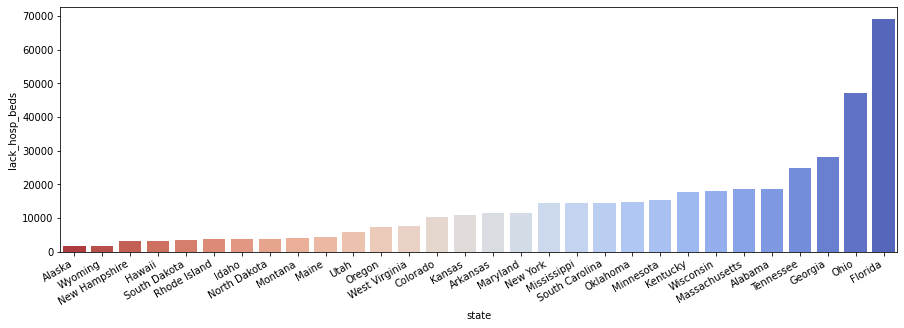

In [0]:
# take a look in the states of critical lack of ICU beds:

plt.figure(figsize=(15,5))
sns.barplot(x='state', y='lack_hosp_beds', data=df, palette = 'coolwarm_r')
plt.gcf().autofmt_xdate()
plt.show()

### 4.2 Balance between hospitalized people and ICU beds

The question is that if these beds are sufficient to attend all hospitalized people. Therefore, to analyze this issue, it is necessary to subtract the numbers of hospitalized people, by the number of ICU beds and see if the balance is positive or negative. And as we can see in the graph below, the situation is very critical in New York if not considering the new beds created by the field hospital.


In [0]:
# create a column with the diference between UCI beds - Hospitalized in the df:

df['lack_UCI_beds'] = df['ICU Beds']-df['hospitalized']
df.head()

,date,state,positive,negative,hospitalized,death,total,hospitalizedIncrease,positiveIncrease,ICU Beds,Polulation60+,60+_perUCI,Total Population,STATE,BEDS,lack_hosp_beds,lack_UCI_beds
0,2020-04-13,Alaska,277.0,7553.0,32.0,8.0,7830.0,1.0,5.0,119,117047,6424.0,738565,Alaska,1813.0,1781.0,87.0
1,2020-04-13,Wyoming,275.0,5689.0,41.0,1.0,5964.0,1.0,14.0,102,123584,10687.0,583200,Wyoming,1829.0,1788.0,61.0
2,2020-04-13,New Hampshire,985.0,10222.0,152.0,23.0,11332.0,6.0,56.0,242,312572,14579.0,1331848,New Hampshire,3398.0,3246.0,90.0
3,2020-04-13,Hawaii,499.0,18345.0,44.0,9.0,18844.0,0.0,13.0,201,326878,7568.0,1421658,Hawaii,3365.0,3321.0,157.0
4,2020-04-13,South Dakota,868.0,8134.0,44.0,6.0,9002.0,1.0,138.0,152,186396,9064.0,855444,South Dakota,3407.0,3363.0,108.0


In [0]:
# sort by values of lack of ICU beds:
df = df.sort_values(['lack_UCI_beds'])

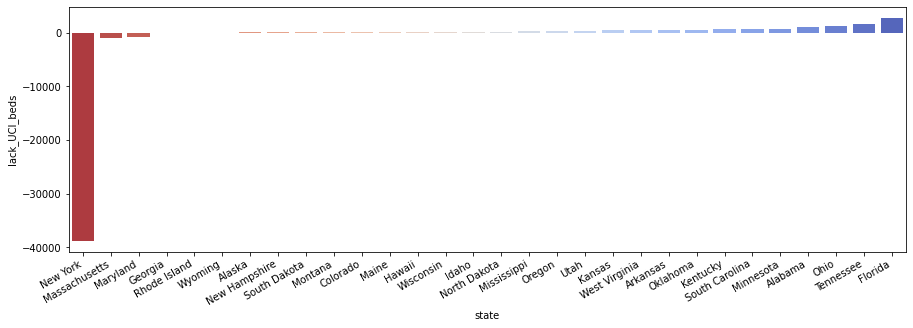

In [0]:
# take a look in the states of critical lack of ICU beds:

plt.figure(figsize=(15,5))
sns.barplot(x='state', y='lack_UCI_beds', data=df, palette = 'coolwarm_r')
plt.gcf().autofmt_xdate()
plt.show()

### 4.3 Relationship between the limit of ICU beds and the fatality rate

You can see that the number of deaths increases almost esponentially from the day the maximum number of ICU beds was reached in NY (2020-03-25).

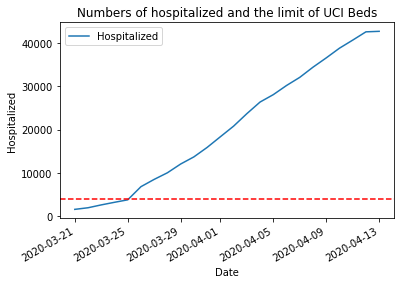

In [0]:
# plot death last days:

#upper = df_NY_ICUcounties['ICU Beds'].sum()
#limit_upper = np.ma.masked_where(df_NY['hospitalized'] < upper, df_NY['hospitalized'])

plt.plot(df_NY['date'], df_NY['hospitalized'])
plt.plot

plt.title('Numbers of hospitalized and the limit of UCI Beds')
plt.ylabel('Hospitalized')
plt.xlabel('Date')
plt.legend(["Hospitalized"])
plt.axhline(limitICU, ls='--', color='r')
plt.gcf().autofmt_xdate()
plt.show()

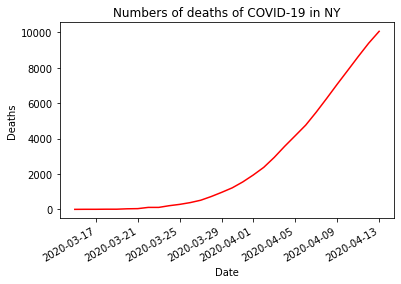

In [0]:
# plot death increase last days

plt.plot(df_NY['date'], df_NY['death'], color='red')
plt.title('Numbers of deaths of COVID-19 in NY')
plt.ylabel('Deaths')
plt.xlabel('Date')

plt.gcf().autofmt_xdate()
plt.show()

## 5. New York healthy system and COVID-19

#### 5.1 Infecteds and the boroughs

When you look at the boroughs with the most people infected, Queens is the region with the highest number. 

In [0]:
# create a NY folium map
NYC_map_boroughs = folium.Map(location=[40.693943, -73.985880], zoom_start=10)

# map with the cases

folium.Choropleth(geo_data="Neighborhood Tabulation Areas (NTA).geojson",
             data=df_nyc_bor_sum, # NYC data cases of COVID-19
             columns=['Borough', 'Total cases'], 
             key_on='feature.properties.boro_name', 
             fill_color='YlOrRd', 
             fill_opacity=0.7, 
             line_opacity=0.2,
             legend_name='COVID-19 cases in NYC').add_to(NYC_map_boroughs)

#display map
NYC_map_boroughs

In [0]:
df_nyc_bor_top = df_nyc_bor_sum[['Borough','Total cases']].sort_values('Total cases', ascending=False)
df_nyc_bor_top.head()

,Borough,Total cases
3,Queens,12467
1,Brooklyn,10735
0,Bronx,7183
2,Manhattan,6106
4,Staten Island,2355


But the region with the highest density of infected, using zipcode contamination data, is the southern region of Manhantan 

In [0]:
# heat map with the density of cases
from folium.plugins import HeatMap

# create a NY folium map
NYC_Heatmap_cases = folium.Map(location=[40.693943, -73.985880], zoom_start=10)

HeatMap(data=df_NYC_borough[['LAT', 'LNG', 'Total cases']].groupby(['LAT', 'LNG']).sum().reset_index().values.tolist(), radius=8, max_zoom=13).add_to(NYC_Heatmap_cases)

#display map 

NYC_Heatmap_cases

#### 5.2 Hospitals and bed distribution in NYC.

According to data obtained, the state of NY has xx hospitals. Most of them are general acute Care hospitals. The 34 hospital for psychiatric issues was dropped, because, in my opinion, it would do little to help patients with breathing problems. Then, the graph below shows the number of each type of hospital



In [0]:
# data with the hospitals in NY:

df_NY_hosp = hosp_df[hosp_df['STATE'].str.contains("NY")]
df_NY_hosp.head()

,ADDRESS,BEDS,CITY,COUNTRY,COUNTY,HELIPAD,LATITUDE,LONGITUDE,ZIP,NAME,STATE,TYPE
442,427 GUY PARK AVE,120.0,AMSTERDAM,USA,MONTGOMERY,Y,42.954417,-74.216064,12010,ST. MARY'S HEALTHCARE,NY,GENERAL ACUTE CARE
453,600 ROE AVE,266.0,ELMIRA,USA,CHEMUNG,Y,42.100149,-76.827760,14905,ARNOT OGDEN MEDICAL CENTER,NY,GENERAL ACUTE CARE
461,1 TITUS PL,25.0,WALTON,USA,DELAWARE,Y,42.164275,-75.128718,13856,DELAWARE VALLEY HOSPITAL,NY,CRITICAL ACCESS
1055,100 HIGH ST,501.0,BUFFALO,USA,ERIE,Y,42.900868,-78.866210,14203,BUFFALO GENERAL MEDICAL CENTER,NY,GENERAL ACUTE CARE
1077,565 ABBOTT RD,438.0,BUFFALO,USA,ERIE,Y,42.847501,-78.811971,14220,MERCY HOSPITAL,NY,GENERAL ACUTE CARE


In [0]:
print(df_NY_hosp['BEDS'].sum())

57083.0


In [0]:
# the types and value counts of the hospitals

df_NY_hosp['TYPE'].value_counts()

GENERAL ACUTE CARE    189
PSYCHIATRIC            34
CRITICAL ACCESS        18
MILITARY               14
REHABILITATION          7
SPECIAL                 5
LONG TERM CARE          5
CHILDREN                3
WOMEN                   2
Name: TYPE, dtype: int64

In [0]:
df_NY_hosp.shape

(243, 15)

In [0]:
# drop the psychiatric hospitals:

df_NY_hosp = df_NY_hosp[~df_NY_hosp.TYPE.str.contains("PSYCHIATRIC")]

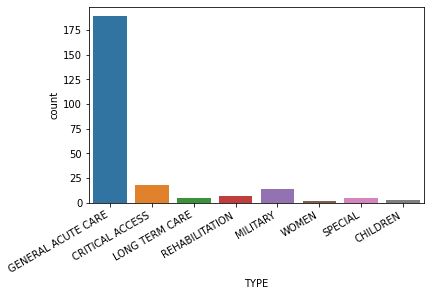

In [0]:
# types of hospitals

sns.countplot(x='TYPE', data=df_NY_hosp)
plt.gcf().autofmt_xdate()

In [0]:
# Make an empty map
hosp_df_type = folium.Map(location=[40.693943, -73.985880], zoom_start=10)
 
# I can add marker one by one on the map
for i in range(0,len(df_NY_hosp)):
   folium.Circle(
      location=[df_NY_hosp.iloc[i]['LATITUDE'], df_NY_hosp.iloc[i]['LONGITUDE']],
      popup=df_NY_hosp.iloc[i]['TYPE'],
      radius=df_NY_hosp.iloc[i]['BEDS']*10,
      color='blue',
      fill=True,
      fill_color='blue'
   ).add_to(hosp_df_type)


# Display map
hosp_df_type

In [0]:
# get the geopraphical coordinates of US:

address = 'New York'
geolocator = Nominatim(user_agent="US_emergency_explorer")
location = geolocator.geocode(address)
latitude = location.latitude
longitude = location.longitude
print('The geograpical coordinate of US are {}, {}.'.format(latitude, longitude))

The geograpical coordinate of US are 40.7127281, -74.0060152.


In [0]:
# -*- coding: utf-8 -*-

from __future__ import (absolute_import, division, print_function)

from folium.plugins.marker_cluster import MarkerCluster
from folium.utilities import _validate_coordinates

from jinja2 import Template


class FasterMarkerCluster(MarkerCluster):
    """
    Add marker clusters to a map using in-browser rendering.
    Using FasterMarkerCluster it is possible to render 000's of
    points far quicker than the MarkerCluster class.
    Be aware that the FastMarkerCluster class passes an empty
    list to the parent class' __init__ method during initialisation.
    This means that the add_child method is never called, and
    no reference to any marker data are retained. Methods such
    as get_bounds() are therefore not available when using it.
    
    Important: 
        Non-render issues: check if you can prune the label-data,
        so some maximum-byte-count is not exceeded, while creating
        the templated-JavaScript Code
    
    Parameters
    ----------
    data: list
        List of list of shape [[], []]. Data points should be of
        the form [[lat, lng]].
        Addition: Lists of shape [[],[],[]] are now accepted.
            The 3rd value in each list-entry contains str(popup_label).
    _template: In the template is defined that the labels are 
        appointed to the markers, 
        AND  
        the category filtering for icon-type/colour is defined,
        by asking if IndexOf('some_string') exists.
        
    callback: string, default None
        A string representation of a valid Javascript function
        that will be passed a lat, lon coordinate pair. See the
        FasterMarkerCluster for an example of a custom callback.
    name : string, default None
        The name of the Layer, as it will appear in LayerControls.
    overlay : bool, default True
        Adds the layer as an optional overlay (True) or the base layer (False).
    control : bool, default True
        Whether the Layer will be included in LayerControls.
    show: bool, default True
        Whether the layer will be shown on opening (only for overlays).
    options : dict, default None
        A dictionary with options for Leaflet.markercluster. See
        https://github.com/Leaflet/Leaflet.markercluster for options.
    """
    _template = Template(u"""
            {% macro script(this, kwargs) %}
            var {{ this.get_name() }} = (function(){
                {{this._callback}}
                var data = {{ this._data }};
                var popup = {{ this._popup }};
                var cluster = L.markerClusterGroup({{ this.options }});
                var category1 = L.layerGroup();
                var category2 = L.layerGroup();

                for (var i = 0; i < popup.length; i++) {
                    var row = data[i];
                    var marker = callback(row);
                    var row2 = popup[i];
                    
                        if (row2.indexOf("during") !== -1) {
                            var icon = L.AwesomeMarkers.icon({icon: "map-marker", markerColor: "red"});
                            marker.setIcon(icon);
                            marker.bindPopup("<h4>"+row2+"<h4>");
                            marker.addTo(category1);
                        } else {
                            var icon = L.AwesomeMarkers.icon({icon: "map-marker", markerColor: "blue"});
                            marker.setIcon(icon);
                            marker.bindPopup("<h4>"+row2+"<h4>");
                            marker.addTo(category2);
                        }                   
                }
                cluster.addLayers(category1);
                cluster.addLayers(category2);
                cluster.addTo({{ this._parent.get_name() }});
                return cluster;
            })();
            {% endmacro %}""")
    
    def __init__(self, data, callback=None, options=None,
                 name=None, overlay=True, control=True, show=True):
        
        super(FasterMarkerCluster, self).__init__(name=name, overlay=overlay,
                                                control=control, show=show,
                                                options=options)
        # Copy inbound data to _popup for labeling,
        # prune only first 2-columns for coordinate validation.
        self._popup = data[:]
        data = [row[0:2] for row in data]
        self._name = 'FasterMarkerCluster'
        self._data = _validate_coordinates(data)

        if callback is None:
            self._callback = """
                var callback = function (row) {
                    var icon = L.AwesomeMarkers.icon();
                    var marker = L.marker(new L.LatLng(row[0], row[1]));
                    marker.setIcon(icon);
                    return marker;
                };"""
        else:
            self._callback = 'var callback = {};'.format(callback)

In [0]:
## callback_template for customised icons --> also available in the normal FastMarkerClusters 
# In the current_class FasterMarkerClusters, the icon-setting will be overwritten from within the _template
# that is stored in the defined class.
callback = """\
function (row) {
    var icon, marker;
    icon = L.AwesomeMarkers.icon({
        icon: "map-marker", markerColor: "red"});
    marker = L.marker(new L.LatLng(row[0], row[1]));
    marker.setIcon(icon);
    return marker;
};
"""

# let's start again with a clean copy of the map of NY
NY_map_bedHospitals = folium.Map(location=[40.71, -74.00], zoom_start=10)

# instantiate a mark cluster object for the incidents in the dataframe in 2 steps:
# parse the labels for each entry with the desired information,
# then call FasterMarkerCluster with the expanded list. 
# Adding this FasterMarkerCluster-Object to the map can be deferred, or added 
# to a FeatureGroup instead, for better layerControl from within Folium 0.7.0
finlist = []
for name,address, beds,typee,helipad in zip(df_NY_hosp['NAME']
                                 ,df_NY_hosp['ADDRESS'], df_NY_hosp['BEDS'], df_NY_hosp['TYPE']
                                , df_NY_hosp['HELIPAD']):

    labelfinal ='<h4>'+ name+'</h4><h6>'+address+'</h6>Type  : <i>'+typee+'</i> with helipad ?<b>'+helipad+'</b>'
    finlist.append(labelfinal)

# Calls the customised class function.    
hosp = FasterMarkerCluster(data=list(zip(df_NY_hosp.LATITUDE,df_NY_hosp.LONGITUDE, finlist)), callback=callback)
hosp.add_to(NY_map_bedHospitals)
 
# Creates a MarkerCluster Object    
unis = plugins.MarkerCluster().add_to(NY_map_bedHospitals)
 
# add the location0 to the map in blue
for lat, lng in zip(df_NY_hosp['LATITUDE'],df_NY_hosp['LONGITUDE']):
    unis.add_child(
        #folium.features.CircleMarker( #### only 0.5 version of folium
        folium.CircleMarker(
            [lat, lng],
            radius=10, # define how big you want the circle markers to be
            color='red',
            fill=True,
            fill_color='blue',
            fill_opacity=0.6
        )
    )

HeatMap(data=df_NY_hosp[['LATITUDE', 'LONGITUDE', 'BEDS']].groupby(['LATITUDE', 'LONGITUDE']).sum().reset_index().values.tolist(), radius=8, max_zoom=13).add_to(NY_map_bedHospitals)

# folium.LayerControl().add_to(NY_map_bedHospitals)

# display map
NY_map_bedHospitals

## 6. DBScan Clustering 

### 6.1 DBScan Clustering hospitals based on their location (Latitude and Longitude)

DBSCAN form sklearn library can runs DBSCAN clustering from vector array or distance matrix. In our case, we pass it the Numpy array Clus_dataSet to find core samples of high density and expands clusters from them.

In [0]:
# transform in a list de coordinates:

xs = df_NY_hosp['LATITUDE'].tolist()
ys = df_NY_hosp['LONGITUDE'].tolist()

df_NY_hosp['xm'] = xs
df_NY_hosp['ym'] = ys

In [0]:
from sklearn.cluster import DBSCAN
import sklearn.utils
from sklearn.preprocessing import StandardScaler
sklearn.utils.check_random_state(1000)

Clus_dataSet = df_NY_hosp[['xm','ym']]
Clus_dataSet = np.nan_to_num(Clus_dataSet)
Clus_dataSet = StandardScaler().fit_transform(Clus_dataSet)

# Compute DBSCAN

db = DBSCAN(eps=0.15, min_samples=3).fit(Clus_dataSet)
core_samples_mask = np.zeros_like(db.labels_, dtype=bool)
core_samples_mask[db.core_sample_indices_] = True
labels = db.labels_
df_NY_hosp["Clus_Db"]=labels

realClusterNum=len(set(labels)) - (1 if -1 in labels else 0)
clusterNum = len(set(labels)) 

# A sample of clusters
df_NY_hosp[["NAME","BEDS","Clus_Db"]].head(5)

,NAME,BEDS,Clus_Db
442,ST. MARY'S HEALTHCARE,120.0,0
453,ARNOT OGDEN MEDICAL CENTER,266.0,1
461,DELAWARE VALLEY HOSPITAL,25.0,-1
1055,BUFFALO GENERAL MEDICAL CENTER,501.0,2
1077,MERCY HOSPITAL,438.0,2


Visualization of clusters based on location

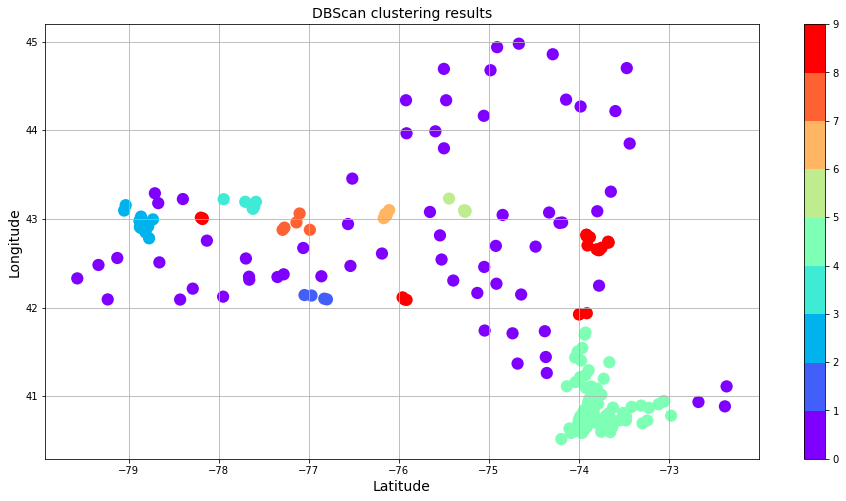

In [0]:
# plot cluster based on location:

fig = plt.figure(figsize=(16,8))
cmap=plt.cm.rainbow
norm = mpl.colors.BoundaryNorm(np.arange(0,10,1), cmap.N)
plt.scatter(df_NY_hosp['LONGITUDE'], df_NY_hosp['LATITUDE'], c=df_NY_hosp['Clus_Db'],
            cmap=cmap, norm=norm, s=150, edgecolor='none')
plt.colorbar(ticks=np.linspace(0,9,10))

plt.xlabel('Latitude', fontsize=14)
plt.ylabel('Longitude', fontsize=14)
plt.title('DBScan clustering results', fontsize=14)
plt.grid()
plt.show()

Visualization based on hospital location and beds

In [0]:
Clus_dataSet = df_NY_hosp[['xm','ym', 'BEDS']]
Clus_dataSet = np.nan_to_num(Clus_dataSet)
Clus_dataSet = StandardScaler().fit_transform(Clus_dataSet)

# Compute DBSCAN

db = DBSCAN(eps=0.5, min_samples=10).fit(Clus_dataSet)
core_samples_mask = np.zeros_like(db.labels_, dtype=bool)
core_samples_mask[db.core_sample_indices_] = True
labels = db.labels_
df_NY_hosp["Clus_Db"]=labels

realClusterNum=len(set(labels)) - (1 if -1 in labels else 0)
clusterNum = len(set(labels)) 

# A sample of clusters
df_NY_hosp[["NAME","BEDS","Clus_Db"]].head(5)

,NAME,BEDS,Clus_Db
442,ST. MARY'S HEALTHCARE,120.0,0
453,ARNOT OGDEN MEDICAL CENTER,266.0,-1
461,DELAWARE VALLEY HOSPITAL,25.0,-1
1055,BUFFALO GENERAL MEDICAL CENTER,501.0,-1
1077,MERCY HOSPITAL,438.0,-1


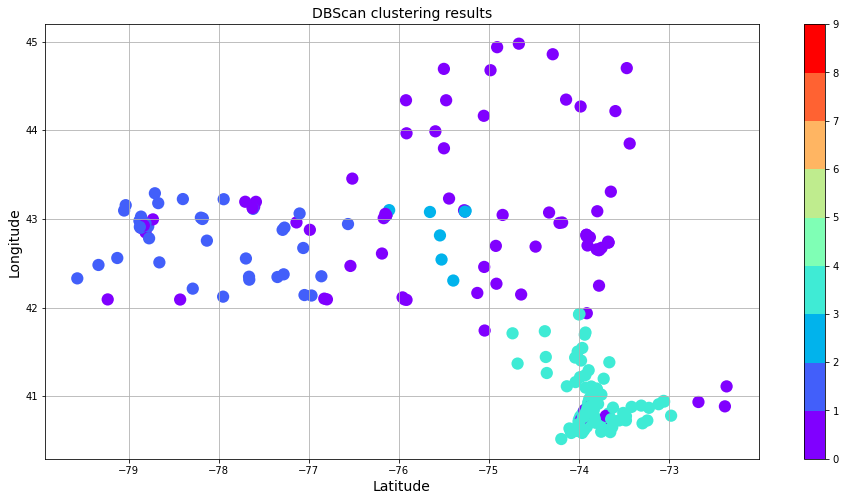

In [0]:
# plot cluster based on location and beds:

fig = plt.figure(figsize=(16,8))
cmap=plt.cm.rainbow
norm = mpl.colors.BoundaryNorm(np.arange(0,10,1), cmap.N)
plt.scatter(df_NY_hosp['LONGITUDE'], df_NY_hosp['LATITUDE'], c=df_NY_hosp['Clus_Db'],
            cmap=cmap, norm=norm, s=150, edgecolor='none')
plt.colorbar(ticks=np.linspace(0,9,10))

plt.xlabel('Latitude', fontsize=14)
plt.ylabel('Longitude', fontsize=14)
plt.title('DBScan clustering results', fontsize=14)
plt.grid()
plt.show()

### 6.2 DBScan Clustering infection on their location (Latitude and Longitude)

In [0]:
# transform in a list de coordinates:

xs = df_NYC_borough['LAT'].tolist()
ys = df_NYC_borough['LNG'].tolist()

df_NYC_borough['xm'] = xs
df_NYC_borough['ym'] = ys

In [0]:
Clus_dataSet = df_NYC_borough[['xm','ym', 'Total cases']]
Clus_dataSet = np.nan_to_num(Clus_dataSet)
Clus_dataSet = StandardScaler().fit_transform(Clus_dataSet)

# Compute DBSCAN

db = DBSCAN(eps=0.4, min_samples=4).fit(Clus_dataSet)
core_samples_mask = np.zeros_like(db.labels_, dtype=bool)
core_samples_mask[db.core_sample_indices_] = True
labels = db.labels_
df_NYC_borough["Clus_Db"]=labels

realClusterNum=len(set(labels)) - (1 if -1 in labels else 0)
clusterNum = len(set(labels)) 

# A sample of clusters
df_NYC_borough[["Cases per 1,000 people","Total cases","Clus_Db"]].head(5)

,"Cases per 1,000 people",Total cases,Clus_Db
0,9,947,-1
1,9,831,-1
2,9,771,-1
3,7,638,-1
4,8,631,-1


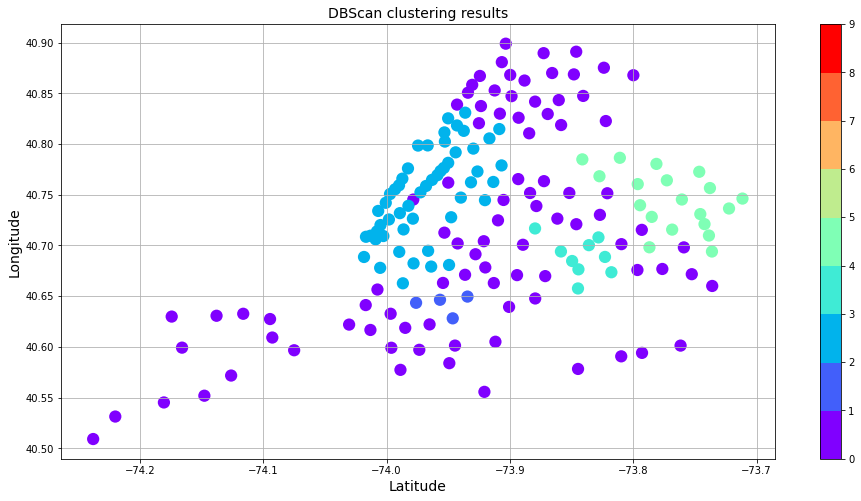

In [0]:
# plot cluster based on location and beds:

fig = plt.figure(figsize=(16,8))
cmap=plt.cm.rainbow
norm = mpl.colors.BoundaryNorm(np.arange(0,10,1), cmap.N)
plt.scatter(df_NYC_borough['LNG'], df_NYC_borough['LAT'], c=df_NYC_borough['Clus_Db'],
            cmap=cmap, norm=norm, s=150, edgecolor='none')
plt.colorbar(ticks=np.linspace(0,9,10))

plt.xlabel('Latitude', fontsize=14)
plt.ylabel('Longitude', fontsize=14)
plt.title('DBScan clustering results', fontsize=14)
plt.grid()
plt.show()

## 7. Optimization (Maximum)

In [0]:
# create a dataframe with the NY cities grouped and select columns sum:

max_beds_NY1 = df_NY_hosp.groupby('CITY')[['BEDS']].sum()
max_beds_NY2 = df_NY_hosp.groupby('CITY')[['LATITUDE','LONGITUDE']].mean() 
max_beds_NY1.reset_index(inplace=True)
max_beds_NY2.reset_index(inplace=True)

max_beds_NY = pd.merge(max_beds_NY1, max_beds_NY2, on='CITY')
max_beds_NY

,CITY,BEDS,LATITUDE,LONGITUDE
0,AKWESASNE,0.0,44.975780,-74.667407
1,ALBANY,1341.0,42.656036,-73.776210
2,ALEXANDRIA BAY,15.0,44.337709,-75.920508
3,AMSTERDAM,130.0,42.956741,-74.201593
4,AUBURN,99.0,42.941353,-76.564368
...,...,...,...,...
138,WEST POINT,0.0,41.401871,-73.977137
139,WESTFIELD,4.0,42.328698,-79.569809
140,WHITE PLAINS,442.0,41.021201,-73.760405
141,WILLIAMSVILLE,265.0,42.994039,-78.730238


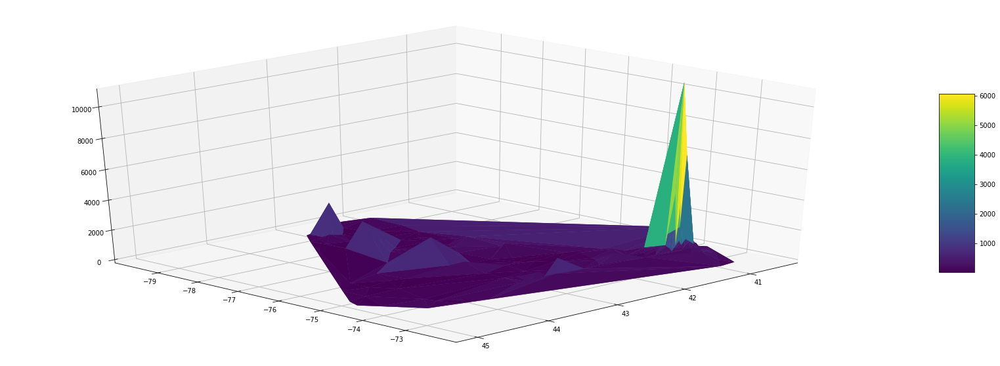

In [0]:
# Make the plot of NY states:

fig = plt.figure(figsize=(30,10))
ax = fig.gca(projection='3d')
ax.plot_trisurf(max_beds_NY['LATITUDE'], max_beds_NY['LONGITUDE'], max_beds_NY['BEDS'], cmap=plt.cm.viridis, linewidth=0.2)
 
# Add a color bar which maps values to colors:
surf=ax.plot_trisurf(max_beds_NY['LATITUDE'], max_beds_NY['LONGITUDE'], max_beds_NY['BEDS'], cmap=plt.cm.viridis, linewidth=0.2)
fig.colorbar( surf, shrink=0.5, aspect=5)

# Rotate it
ax.view_init(30, 45)
plt.show()

In [0]:
# create a dataframe with the states grouped and select columns sum:

max_beds_US1 = hosp_df.groupby('STATE')[['BEDS']].sum()
max_beds_US2 = hosp_df.groupby('STATE')[['LATITUDE','LONGITUDE']].mean() 
max_beds_US1.reset_index(inplace=True)
max_beds_US2.reset_index(inplace=True)

max_beds_US = pd.merge(max_beds_US1, max_beds_US2, on='STATE')
max_beds_US.head()

,STATE,BEDS,LATITUDE,LONGITUDE
0,AK,1813.0,60.749784,-148.938992
1,AL,19000.0,32.902210,-86.751200
2,AR,11699.0,35.070525,-92.656004
3,AZ,15452.0,33.429017,-111.702693
4,CA,104034.0,35.849493,-119.640114


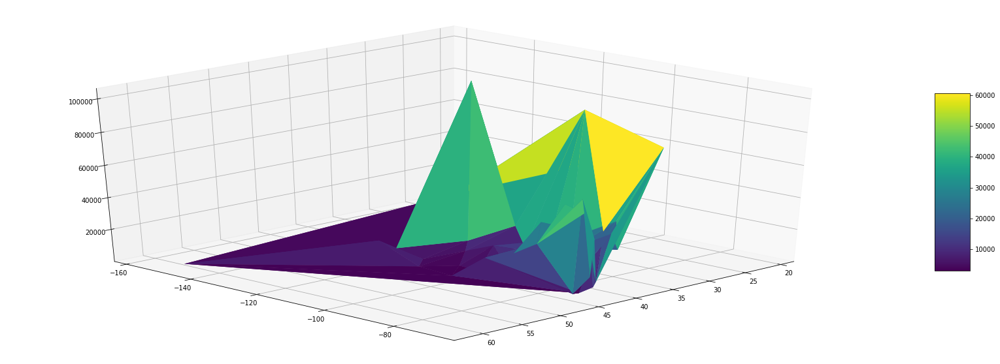

In [0]:
# Make the plot of US states:

fig = plt.figure(figsize=(30,10))
ax = fig.gca(projection='3d')
ax.plot_trisurf(max_beds_US['LATITUDE'], max_beds_US['LONGITUDE'], max_beds_US['BEDS'], cmap=plt.cm.viridis, linewidth=0.2)
 
# Add a color bar which maps values to colors:
surf=ax.plot_trisurf(max_beds_US['LATITUDE'], max_beds_US['LONGITUDE'], max_beds_US['BEDS'], cmap=plt.cm.viridis, linewidth=0.2)
fig.colorbar( surf, shrink=0.5, aspect=5)

# Rotate it
ax.view_init(30, 45)
plt.show()